# Project

In [1]:
student_name = 'Yutae Lee'

## Overview

This project utilizes the notes on optimal recovery - data assimilation.  You will ultimately implement Algorithm 1 from those notes using Pandas and cvxpy, and will use your implementation to estimate both the global mean temperature and the mean temperature at a given location.  During this project you will become familiar with manipulating and using Pandas DataFrames, including those with MultiIndex's.  




## Instructions

1. Run the code blocks provided to load the [temperature data](#Load-Temperature-Data) and [station inventory](#Load-Station-Inventory).  

1. Complete the function `compute_monthly_temperature_means` to return the global monthly mean temperature by simple averaging.

1. Complete the function `compute_annual_temperature_means` to return the global annual mean temperature by simple averaging.

1. Complete the functions `get_operating_stations_by_year` and `get_operating_stations_by_month` to identify the stations operating in the given date ranges.

1. Complete the function `get_station_locations` to return the latitudes and longitudes of the passed set of stations from the inventory.

1. Complete the function `get_valid_station_temps_by_month` and `get_valid_station_temps_by_year`.  These functions will give access to the valid monthly and annual temperature data for all stations operating during the specified dates.

1. Complete the function `setup_system_global_mean_pwc` to create the system matrix and right hand side for the minimization.  The system matrix will have the number of rows equal to the number of basis functions, e.g. the number of cells (boxes) in our grid, and the number of columns equal to the number of measurements.  The values in this matrix will be either zero or one.  If an entry at (row, col) is one, then the measurement corresponding to col exists within the box corresponding to row.  The entries in the right hand side should be equal to the area of the grid cell (box) divided by the total surface area.  For the surface area of a grid cell (box) you can use the formula $\frac{\pi}{180} \cdot E^2 \cdot |sin(b_0) - sin(b_1)| \cdot |b_2 - b_3|$, where $E = 6375$km is an approximate radius of the Earth and $[b_0, b_1, b_2, b_3]$ are the north, south latitudes and west, east longitudes respectively.
Also, complete the `box_contains` function as it will be helpful in your implementation of `setup_system_global_mean_pwc` and `setup_system_location_mean_pwc` later in the project.  The function simply returns True if the passed latitude and longitude are "within" the box and False otherwise.  A lat,lon pair is within a box if south < lat <= north and west < lon <= east.  Do note that with this test we exclude any station that is located at the south pole, which we will ignore for this project.

1. Complete the function `optimize_weights_pwc` using cvxpy to perform the optimization from Algorithm 1 in the notes with piece-wise constant basis.  

1. Complete the function `optimize_global_mean_pwc`.  This function will compute either the global mean temperature for a given month in a given year, or if month is None then it will compute the global annual mean temperature for the given year.  This function should leverage the functions you have already implemented and should return the global temperature, $\sum_{i=1}^m a_i \cdot y_i$.

1. For this function you may copy your implementation from `setup_system_global_mean_pwc` and modify it slightly to implement `setup_system_location_mean_pwc`.  Instead of the global mean temperature, our quantity of interest will be a location (or grid cell in this instance).  The matrix $B$ should be the same, but the entries in the righthand side $c$ should only be set if the corresponding basis function is non-zero at `eval_location`. 

1. For this function you may copy your implementation from `optimize_global_mean_pwc` and modify it slightly to implement `optimize_location_mean_pwc` as it should only differ by the use of `setup_system_location_mean_pwc`.

1. Complete the function `get_station_data_by_state` to identify all stations in a given state and return new DataFrame's containing only those stations and their data.  Be aware that the inventory may contain stations that do not appear in the data, and the returned DataFrames should not contain station data for stations that do not appear in both returned DataFrames.



## GISTEMP Data

We have already dowloaded and preprocessed the data for this project, which can be found in the data subdirectory.  However if you wish to explore the raw data and the software used to process it then download [gistemp4.0.tar.gz](https://data.giss.nasa.gov/gistemp/sources_v4/gistemp4.0.tar.gz) from the [GISS Surface Temperature Analysis](https://data.giss.nasa.gov/gistemp/sources_v4/) website.  The website and archive contain instructions on how to install and run the Python code.  

If you choose to run GISTEMP, while running if you receive an error regarding a missing file, namely: gistemp4.0/tmp/input/Ts.strange.v4SCAR.list.IN_full, this is because the authors have a typo in gistemp4.0/steps/read_config.py.  The letters SCAR should not be in the file name.  You can either correct the read_config.py source code or change the file name gistemp4.0/tmp/input/Ts.strange.v4SCAR.list.IN_full to gistemp4.0/tmp/input/Ts.strange.v4.list.IN_full. 

## Submitting Your Assignment

You will submit your completed assignment in two formats:

- Jupyter Notebook (.ipynb)
- HTML (.html)

##### Jupyter Notebook (.ipynb)
You may directly use this notebook to complete your assignment or you may use an external editor/IDE of your choice.  However, to submit your code please ensure that your code works in this notebook.  
  
##### HTML (.html)
To create an HTML file for your assignment simply select `File > Download as > HTML (.html)` from within the Jupyter Notebook.  
  
Both files should be uploaded to [Canvas](https://canvas.tamu.edu).

## Installing Required Packages

For this project we will be using several modules, some of which are not included in a standard installation of Python and/or Anaconda.

For Linux and Mac users the following instructions can be performed in any shell of your choosing.  For Windows users the instructions are written for use in the `Anaconda Powershell Prompt (anaconda3)` application.

We will use the conda package installer to help us acquire and install necessary packages.  One could also use pip the Python Package Installer, but this may be more involved depending on your system/setup.  A common error made by those new to anaconda and/or python is to install pacakges using the wrong pacakge manager, as there may be multiple versions of conda, python etc on their system.  Before installing the packages below be sure to first identify the correct conda (or pip).  For Linux and Mac we will assume that Anaconda was installed locally in your home directory and the bin directory is located at `~/opt/anaconda3/bin/` (Verify the location on your system in the event your installation/setup is different).  For Windows users we will assume you are using the `Anaconda Powershell Prompt (anaconda3)` application.  The instructions below assume that the correct conda can be found in your path, however you can always use the full or relative path for your system (e.g. `~/opt/anaconda3/bin/conda`).

Install the following packages before attempting to complete project.


### CVX

1. (Windows Only) This package requires the [Visual Studio build tools for Python 3](https://visualstudio.microsoft.com/thank-you-downloading-visual-studio/?sku=BuildTools&rel=16).  Download and install the package.  Then modify the Visual Studio Build Tools in the `Workloads` tab by clicking the checkbox for `C++ build tools` and then clicking the install/modify button in the bottom right corner of the window.  See [instructions from cvxpy.org](https://drive.google.com/file/d/0B4GsMXCRaSSIOWpYQkstajlYZ0tPVkNQSElmTWh1dXFaYkJr/view).

1. conda install -c conda-forge cvxpy


### Cartopy

Anaconda users can use the following:

1. conda install --channel conda-forge cartopy

Alternatively, pip can be used.  However, currently cartopy requires that shapely be installed from source. The second and third step here uninstall shapely and perform a reinstall from source.

1. `pip install cartopy`

1. `pip uninstall shapely`

1. `pip install --no-binary :all: shapely`


If errors are encountered using pip above (e.g. geos requires proj 8.0.0), then the installation may become more involved.

	MacOS
		MacPorts Users:  
			sudo port install py-cartopy

		HomeBrew -> see https://scitools.org.uk/cartopy/docs/latest/installing.html
			brew install proj geos
			pip install --upgrade pyshp
			# shapely needs to be built from source to link to geos. If it is already
			# installed, uninstall it by: pip uninstall shapely
			pip install shapely --no-binary shapely
			brew install pkg-config
			export PKG_CONFIG_PATH=/usr/local/bin/pkgconfig
			pip install cartopy

	Windows
		Instructions outside of Anaconda are not given here.  
        If anyone falls into this category please discuss with the instructor

	Linux
		Install proj (https://proj.org/install.html#install) <- look for your specific distro
		Install GEOS (https://libgeos.org/usage/install/)
		pip install --upgrade pyshp
		# shapely needs to be built from source to link to geos. If it is already
		# installed, uninstall it by: pip3 uninstall shapely
		pip install shapely --no-binary shapely
		pip install cartopy



### Gurobi Solver (optional)

1. Acquire an academic license from the [Gurobi](https://www.gurobi.com) website.  See the [Academic License](https://www.gurobi.com/academia/academic-program-and-licenses/) page for instructions on downloading and installing the Gurobi Optimizer on your system.

1. `conda config --add channels http://conda.anaconda.org/gurobi`

1. `conda install gurobi`









## Imports

In [2]:
import pandas as pd
import numpy as np

# Optimization
import cvxpy as cp

# Plotting
import matplotlib.pyplot as plt

import cartopy.crs as ccrs
from cartopy.io.shapereader import Reader
import cartopy.io.img_tiles as cimgt
from cartopy.feature import ShapelyFeature
from shapely.geometry.polygon import LinearRing





## Helper Functions

The following code block contains functions for loading data, creating grids and plotting.

In [3]:

def load_GISTEMP_step_data(file):
    """
    Loads the GISTEMP station temperature data file.
    file - The path and file name of the station temperature data file to be loaded.
    Returns - A Pandas DataFrame with MultiIndex containing the station ID and years of
        operation, and columns containing the mean temperature recorded at each
        station during the month (column) and year (row).
    """
    df = pd.read_fwf(file, 
                     colspecs=[(  0 , 11 ), # ID
                               ( 11 , 15 ), # Year
                               ( 19 , 24 ), # Jan
                               ( 27 , 32 ), # Feb
                               ( 35 , 40 ), # Mar
                               ( 43 , 48 ), # Apr
                               ( 51 , 56 ), # May
                               ( 59 , 64 ), # Jun
                               ( 67 , 72 ), # Jul
                               ( 75 , 80 ), # Aug
                               ( 83 , 88 ), # Sep
                               ( 91 , 96 ), # Oct
                               ( 99 , 104 ),# Nov
                               ( 107 , 112 )# Dec
                              ],
                     names=['ID',
                            'Year',  
                            'January', 
                            'February',
                            'March', 
                            'April', 
                            'May', 
                            'June',
                            'July', 
                            'August',
                            'September',
                            'October', 
                            'November',
                            'December',
                           ],
                     index_col=[0,1])
    
    # replace the fill value (-9999) with np.nan
    df.where(df != -9999, other=np.nan, inplace=True)
    # convert to degrees Celcius
    df /= 100 

    return df


def load_GISTEMP_step_inv(file):
    """
    Loads the GISTEMP inventory file.
    file - The path and file name of the inventory file to be loaded.
    Returns - A Pandas DataFrame containing the latitude, longitude and station 
        name (columns), and indexed by the station ID's (rows).
    """
    # Read the station inventory - this provides GPS locations and names for each station
    inv_df = pd.read_fwf(file,                         
                         colspecs=[(  0 , 11 ), # ID
                                   ( 12 , 20 ), # Latitude
                                   ( 21 , 30 ), # Longitude
                                   ( 38 , 68 )  # Station Name
                                  ],
                         names=['ID', 
                                'lat',  
                                'lon', 
                                'name'
                               ],
                         index_col=0)

    return inv_df

    
def create_hansen_grid_80():
    """
    Creates a grid of approximately equal area 'boxes' around the globe.
    Hansen, J.E., and S. Lebedeff, 1987: Global trends of measured surface air 
    temperature. J. Geophys. Res., 92, 13345-13372, doi:10.1029/JD092iD11p13345.
    
    Returns - A list of lists.  The returned list contains 80 such sublists (boxes)
        of nearly equal surface area according to Hansen et al.  Each sublist 
        represents the north & south latitude, west & east longitude respectively.  
    """
    
    # North / South latitudes of the bands
    band_lats = 180 / np.pi * np.arcsin([1, 0.9, 0.7, 0.4, 0])
    
    # The number of boxes in each band around the globe, 4 at the poles and 16 
    # at the equator
    band_boxes = [4, 8, 12, 16]
    
    boxes = []
    for band_idx, num_band_boxes in enumerate(band_boxes):        
        for box_idx in range(num_band_boxes):
            
            # Northern Box
            n_box = [band_lats[band_idx],                         # north lat
                     band_lats[band_idx + 1],                     # south lat
                     -180 + 360 * box_idx / num_band_boxes,       # west lon
                     -180 + 360 * (box_idx + 1) / num_band_boxes  # east lon
                    ]
            # Southern Box
            s_box = [-n_box[1],
                     -n_box[0],
                     n_box[2],
                     n_box[3]
                    ]
            boxes.append(n_box.copy())
            boxes.append(s_box.copy())
    return boxes


def create_texas_grid(grid_size=9):
    """
    Creates a 'square' grid approximately enclosing the state of Texas.
    grid_size - The number of grid lines in each direction to be equally 
        distributed in latitude and longitude.  The number of boxes in each
        direction is equal to grid_size-1.
    Returns - A list of lists.  The returned list contains (grid_size-1)**2 sublists
        (boxes) equally distributed, with respect to latitude and longitude between
        25.75 and 36.5 degrees latitude, and between -106.75 and -93.5 degrees
        longitude, approximately enclosing the state of Texas.  Each sublist 
        represents the north & south latitude, west & east longitude respectively.  
    """
    lon_stops = np.linspace(-106.75, -93.5, num=grid_size)
    lat_stops = np.linspace(25.75, 36.5, num=grid_size)

    texas_boxes = []
    for lat_idx in range(len(lat_stops)-1):

        for lon_idx in range(len(lon_stops)-1):
            texas_boxes.append([lat_stops[lat_idx+1],# north
                                lat_stops[lat_idx],  # south
                                lon_stops[lon_idx],  # west
                                lon_stops[lon_idx+1] # east
                               ])
    return texas_boxes


   

In [4]:
def plot_gps_locations_world_cartopy(lat, lon, title='Station Locations', boxes=None, create_fig=True, temp=None):
    """
    Plots the station positions and optional grid on the world map.
    lat - The latitudes (in degrees) of each station to be plotted.  Each value
        is expected to be in the range [-90, 90], where 90 degrees is the north
        pole and -90 degrees is the south pole.
    lon - The longitudes (in degrees) of each station to be plotted.  Each value
        is expected to be in the range [-180, 180], where 0 degrees is the Prime
        Meridian with west negative and east positive from 0.
    title - A string to be displayed as the title of the plot.
    boxes - If boxes is None then no grid will be drawn.  If boxes is not None
        then it is expected to be an iterable whose elements are lists containing
        four values representing the north and south latitudes and west and east
        longitudes, in that order.
    create_fig - If fig is True then a new figure will be created for the plot, 
        otherwise no figure will be created for the plot.
    temp - If None all locations are drawn in red.  Otherwise, temp is expected
        to contain a numeric value for each location (lat,lon) and will be used
        to color that location using the colormap RdYlBu_r; clamped to the range
        [-45, 45].
    """
    if create_fig:
        fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.Robinson())
    ax.set_global()

    ax.stock_img()
    ax.coastlines()
    
    if boxes is not None:
        for box in boxes:
            lons = [box[2], box[3], box[3], box[2]]
            lats = [box[0], box[0], box[1], box[1]]
            ring = LinearRing(list(zip(lons, lats)))
            ax.add_geometries([ring], ccrs.PlateCarree(), facecolor=None, edgecolor='black', alpha=0.5)

    x,y = lon.to_list(), lat.to_list()
    if temp is None:
        ax.scatter(x, y, marker='D',color='r', s=1, transform=ccrs.PlateCarree())
    else:
        cm = plt.cm.get_cmap('RdYlBu_r')
        sc = ax.scatter(x, y, c=temp, marker='D', s=1, cmap=cm, transform=ccrs.PlateCarree())
        plt.colorbar(sc, label='Temperature (°C)', orientation='horizontal');  
        
    plt.title(title)


def plot_gps_locations_texas_cartopy(lat, lon, title='Texas Station Locations', boxes=None, 
                                     marker_location=None, create_fig=True):
    """
    Plots the station positions and optional grid on the map of Texas.
    lat - The latitudes (in degrees) of each station to be plotted.  Each value
        is expected to be in the range [-90, 90], where 90 degrees is the north
        pole and -90 degrees is the south pole.
    lon - The longitudes (in degrees) of each station to be plotted.  Each value
        is expected to be in the range [-180, 180], where 0 degrees is the Prime
        Meridian with west negative and east positive from 0.
    title - A string to be displayed as the title of the plot.
    boxes - If boxes is None then no grid will be drawn.  If boxes is not None
        then it is expected to be an iterable whose elements are lists containing
        four values representing the north and south latitudes and west and east
        longitudes, in that order.
    marker_location - If None no marker is plotted.  Otherwise this is expected
        to be a tuple containing the latitude and longitude of a single position
        that will be drawn as a black x on the map.
    create_fig - If fig is True then a new figure will be created for the plot, 
        otherwise no figure will be created for the plot.
    """
    if create_fig:
        fig = plt.figure(figsize=(10, 8))

    extent = [-107, -92, 24, 38]
    central_lon = np.mean(extent[:2])
    central_lat = np.mean(extent[2:])
    ax = plt.axes(projection=ccrs.AlbersEqualArea(central_lon, central_lat))
    ax.set_extent(extent)
    ax.coastlines()
    terrain = cimgt.Stamen('terrain-background')
    ax.add_image(terrain, 8)
    
    # Texas Shapefile http://gis-txdot.opendata.arcgis.com/datasets/texas-state-boundary/data
    shape_feature = ShapelyFeature(Reader('Texas_State_Boundary-shp/State.shp').geometries(),
                                   ccrs.PlateCarree(), 
                                   edgecolor='black',
                                   facecolor='none')
    ax.add_feature(shape_feature)
    if boxes is not None:
        for box in boxes:
            lons = [box[2], box[3], box[3], box[2]]
            lats = [box[0], box[0], box[1], box[1]]
            ring = LinearRing(list(zip(lons, lats)))
            ax.add_geometries([ring], ccrs.PlateCarree(), facecolor=None, edgecolor='black', alpha=0.5)

    x,y = lon.to_list(), lat.to_list()
    ax.scatter(x, y, marker='D',color='r', s=16, transform=ccrs.PlateCarree(), zorder=999)


    if marker_location is not None:
        marker_x,marker_y = marker_location[1], marker_location[0]
        ax.scatter(marker_x, marker_y, marker='x',color='k', s=40, transform=ccrs.PlateCarree())

    plt.title(title)
    plt.show()
    

## Load Temperature Data

The following block loads the processed GISTEMP data, and organizes it using a Pandas DataFrame. 

In [6]:
gistemp_file = 'data/step0.v4'

gistemp_df = load_GISTEMP_step_data(gistemp_file)
gistemp_df

January  February  March  April    May   June   July  \
ID          Year                                                         
ACW00011604 1961    -0.85      2.40   4.76   7.77  11.32  16.03  15.74   
            1962     1.17      0.89  -1.50   6.39   9.12  13.85  15.14   
            1963    -7.09     -5.49  -0.95   5.45  12.28  16.31  16.24   
            1964     0.66     -0.81   0.59   7.42  12.23  14.46  15.10   
            1965     0.48     -1.01   0.42   5.94   9.91  15.04  14.91   
...                   ...       ...    ...    ...    ...    ...    ...   
ZIXLT622116 1966    21.80     20.40  18.40  16.90  14.30  12.80  12.10   
            1967    21.10     19.90  18.90  19.20  15.10  13.50  11.00   
            1968    21.80     20.00  19.30  18.20  15.60  10.80  13.70   
            1969    20.90     21.50  19.50  18.30  14.10  13.10  11.60   
            1970    20.70     19.90  19.30  17.20  15.60  13.30  13.30   

                  August  September  October  November  December  
ID          Year                                                  
ACW00011604 1961   14.85      14.17    11.78      5.14     -0.35  
            1962   13.97      11.67     9.98      3.27     -1.22  
            1963   16.00      13.36     9.44      5.70     -1.04  
            1964   15.61      12.25     7.92      5.50      1.16  
            1965   14.81      13.81     9.78      0.35     -1.74  
...                  ...        ...      ...       ...       ...  
ZIXLT622116 1966   14.60      17.70    19.80     20.90     21.10  
            1967   13.80      16.60    20.80     19.90     19.10  
            1968   16.30      17.60    21.80     18.40     20.70  
            1969   14.60      17.80    21.00     20.40     19.10  
            1970   15.40      20.40    20.30     21.30     21.50  

[1304282 rows x 12 columns]

## Load Station Inventory

The following block loads the inventory of stations, and creates a Pandas DataFrame containing their positions and names.

In [7]:
gistemp_inv_file = 'data/v4.inv'

gistemp_inv_df = load_GISTEMP_step_inv(gistemp_inv_file)
gistemp_inv_df

,lat,lon,name
ID,,,
ACW00011604,57.7667,11.8667,SAVE
AE000041196,25.3330,55.5170,SHARJAH_INTER_AIRP
AEM00041184,25.6170,55.9330,RAS_AL_KHAIMAH_INTE
AEM00041194,25.2550,55.3640,DUBAI_INTL
AEM00041216,24.4300,54.4700,ABU_DHABI_BATEEN_AIR
...,...,...,...
ZI000067983,-20.2000,32.6160,CHIPINGE
ZI000067991,-22.2170,30.0000,BEITBRIDGE
ZIXLT371333,-17.8300,31.0200,HARARE_BELVEDERE


## Your Solution (2): Compute Monthly Means

Complete the function `compute_monthly_temperature_means` to return the global monthly mean temperature by simple averaging.

In [9]:

def compute_monthly_temperature_means(df, begin_year=None, end_year=None):
    """
    Computes the mean temperature of every column (month) in the passed DataFrame, df,
    in the range [begin_year, end_year], inclusive.  The passed DataFrame is expected
    to contain a MultiIndex in which the first level is the station ID, and the second
    level contains the set of years during which the corresponding station was in 
    service.  The mean temperatures are given per column for all stations operating
    wholly or partially within the given range [begin_year, end_year].
    begin_year - The first year to be included in the mean.  If begin_year is None
        then the first available year in the data is used.  All stations in service
        during this year or after (but not after end_year) are inlcuded in the means.
    end_year - The last year to be included in the mean.  If end_year is None
        then the last available year in the data is used.  All stations in service
        during this year or before (but not before begin_year) are inlcuded in the means.
    Returns - A Pandas Series containing the mean temperatures of the columns in 
        the DataFrame over the specified range of years.  The series name property will
        be set to 'monthly mean'.
    """
    if begin_year == None:
        if end_year == None:
            monthly_mean = df.mean()
        else:
            monthly_mean = df.loc[pd.IndexSlice[:,:end_year],:].mean()
    else:
        if end_year == None:
            monthly_mean = df.loc[pd.IndexSlice[:,begin_year:],:].mean()
        else:
            monthly_mean = df.loc[pd.IndexSlice[:,begin_year:end_year],:].mean()
            
    return monthly_mean



## Test Code

In [10]:
print('::: Global Monthly Mean - All Time :::')
print(compute_monthly_temperature_means(gistemp_df))

print('\n::: Global Monthly Mean - 1951-1980 :::')
print(compute_monthly_temperature_means(gistemp_df, 1951, 1980))

::: Global Monthly Mean - All Time :::
January       0.839038
February      2.250228
March         5.954915
April        10.515124
May          14.832612
June         18.445347
July         20.597414
August       19.998515
September    16.763987
October      11.937828
November      6.454189
December      2.248589
dtype: float64

::: Global Monthly Mean - 1951-1980 :::
January       0.527798
February      2.207161
March         5.778525
April        10.545760
May          14.843142
June         18.435053
July         20.454341
August       19.838046
September    16.678704
October      12.049702
November      6.599356
December      2.362391
dtype: float64


## Your Solution (3): Compute Annual Means

Complete the function `compute_annual_temperature_means` to return the global annual mean temperature by simple averaging.

In [11]:

def compute_annual_temperature_means(df, begin_year=None, end_year=None):
    """
    Computes the mean annual temperature of all stations in every year in the passed 
    DataFrame, df, in the range [begin_year, end_year], inclusive.  The passed DataFrame 
    is expected to contain a MultiIndex in which the first level is the station ID, and 
    the second level contains the set of years during which the corresponding station 
    was in service.  The mean annual temperature is computed in two steps:
      1) The monthly mean is computed from all stations operating in each year with the
         passed range [begin_year, end_year].  The result of this step alone is a 
         DataFrame where each row correpsonds to a single year, and each column 
         corresponds to a single month.  The values stored in the DataFrame are the the
         mean temperatures from all stations operating during the given month and year.
      2) The annual mean is computed by the naive mean of all rows in the result of the 
         first step.
    begin_year - The first year to be included in the mean.  If begin_year is None
        then the first available year in the data is used.  All stations in service
        during this year or after (but not after end_year) are inlcuded in the means.
    end_year - The last year to be included in the mean.  If end_year is None
        then the last available year in the data is used.  All stations in service
        during this year or before (but not before begin_year) are inlcuded in the means.
    Returns - A Pandas Series containing the mean temperatures of the columns in 
        the DataFrame over the specified range of years.  The year indices in the returned
        Series should be sorted in ascending order (small to large). The series name 
        property will be set to 'annual mean'.
    """
    if begin_year == None:
        if end_year == None:
            annual_mean = df.droplevel(0).groupby('Year').mean()
        else:
            annual_mean = df.loc[pd.IndexSlice[:,:end_year],:].groupby('Year').mean()
    else:
        if end_year == None:
            annual_mean = df.loc[pd.IndexSlice[:,begin_year:],:].groupby('Year').mean()
        else:
            annual_mean = df.loc[pd.IndexSlice[:,begin_year:end_year],:].groupby('Year').mean()
            
    return annual_mean
        
    


## Test Code

In [12]:
print('::: Global Annual Mean - All Time :::')
print(compute_annual_temperature_means(gistemp_df, None, None))

print('\n::: Global Annual Mean - 1951-1980 :::')
print(compute_annual_temperature_means(gistemp_df, 1951, 1980))

::: Global Annual Mean - All Time :::
       January  February     March      April        May       June  \
Year                                                                  
1880  2.915912  3.691787  6.190416  10.887688  15.152209  18.032604   
1881 -0.356433  2.246739  5.840828   9.789661  15.263699  17.524669   
1882  2.585282  3.920680  7.013544  10.156496  14.173873  17.856155   
1883  0.163818  2.198506  3.809604  10.027035  14.381767  18.597995   
1884  0.749814  2.553821  5.482132   9.593741  14.621028  17.677841   
...        ...       ...       ...        ...        ...        ...   
2016  1.409742  4.802096  8.033419  11.381601  15.083352  19.472211   
2017  2.009847  4.789898  7.372866  11.234160  14.970240  19.015193   
2018  1.764634  2.594679  6.027857  10.007825  16.640198  19.238214   
2019  1.775588  1.821886  6.019490  11.181784  14.576653  18.733319   
2020  3.224639  3.960402  7.917143  10.809297  15.166990  19.291754   

           July     August  September 

## Your Solution (4): Identify Operating Stations

Complete the functions `get_operating_stations_by_year` and `get_operating_stations_by_month` to identify the stations operating in the given date ranges.

In [30]:

def get_operating_stations_by_year(df, begin_year=None, end_year=None):
    """
    Creates and returns a Pandas Index containing the unique set of station id's
    for all stations operating between begin_year and end_year inclusive.  The 
    included stations are those that have at least on non-NaN entry during at 
    least one month in any year (not necessarily all years) within the passed 
    range of years.
    df - A Pandas DataFrame with MultiIndex containing the station ID and years of
        operation, and columns containing the mean temperature recorded at each
        station during the month (column) and year (row).
    begin_year - The first year to be included.  If begin_year is None then the 
        first available year in the data is used.  All stations in service during 
        this year or after (but not after end_year) are inlcuded in the set of 
        returned station ids.
    end_year - The last year to be included.  If end_year is None then the last 
        available year in the data is used.  All stations in service during this 
        year or before (but not before begin_year) are inlcuded in the set of 
        returned station ids.
    Returns - A Pandas Index containing the ids of all operating stations in the
        given range of years.  The name property of the Index set will be set to 
        'ID'.
    """
    if begin_year is None:
        begin_year = 0
    if end_year is None:
        end_year = 2022
    
    df2 = df.loc[(slice(None), range(begin_year,end_year+1)),:]
    
    df3 = df2.dropna(thresh=1) #at least one month is not NaN
    
    stations = df3.index.get_level_values(0)
    
    return stations
    
    

def get_operating_stations_by_month(df, month, begin_year=None, end_year=None):
    """
    Creates and returns a Pandas Index containing the unique set of station id's
    for all stations operating between begin_year and end_year inclusive, and have 
    valid (non-NaN) data during the given month (not necessarily in all years).  
    df - A Pandas DataFrame with MultiIndex containing the station ID and years of
        operation, and columns containing the mean temperature recorded at each
        station during the month (column) and year (row).
    month - A string from the set of column names (months) in df.  Only stations
        with valid (non-NaN) data during this month will be included in the returned
        Pandas Index.
    begin_year - The first year to be included.  If begin_year is None then the 
        first available year in the data is used.  Stations in service during 
        this year or after (but not after end_year) with valid data during month
        are inlcuded in the set of returned station ids.
    end_year - The last year to be included.  If end_year is None then the last 
        available year in the data is used.  Stations in service during this year 
        or before (but not before begin_year) with valid data during month are
        inlcuded in the set of returned station ids.
    Returns - A Pandas Index containing the ids of all operating stations in the
        given range of years with valid data in month.  The name property of the 
        Index set will be set to 'ID'.
    """
    if begin_year is None:
        begin_year = 0
    if end_year is None:
        end_year = 2022
    
    df2 = df.loc[(slice(None), range(begin_year,end_year+1)),:]
    df3 = df2[month]
    df3 = df3.dropna()
    
    stations = df3.index.get_level_values(0)
    
    return stations



## Your Solution (5): Get Station Locations

Complete the function `get_station_locations` to return the latitudes and longitudes of the passed set of stations from the inventory.  

In [31]:

def get_station_locations(inv_df, stations=None):
    """
    Returns the positions of the set of passed stations.
    as Pandas Series of the 
    columnes named lat_colname and lon_colname from the DataFrame df for the
    set of stations in operation between begin_year and end_year, inclusive.  
    inv_df - A Pandas DataFrame containing the latitude and longitude 
        (columns), and indexed by the station ID's.
    stations - A Pandas Series of station ID's that should be found in inv_df
        and their positions returned. If stations is None then all station
        locations in the inventory should be returned.
    Returns - A tuple containing the latitudes and longitudes of the set of
        stations found in both stations and inv_df.  Both the latitudes and
        longitudes are represented as Pandas Series.  The series name 
        property for the returned Series will be set to their respective 
        column names in inv_df.
    """
    if stations is None:
        station_locations = (inv_df['lat'], inv_df['lon'])
    else:
        station_locations = (inv_df.loc[stations]['lat'], inv_df.loc[stations]['lon'])
    return station_locations



## Test Code

Run the following code block to demonstrate your implementation and plot all station locations in the inventory.

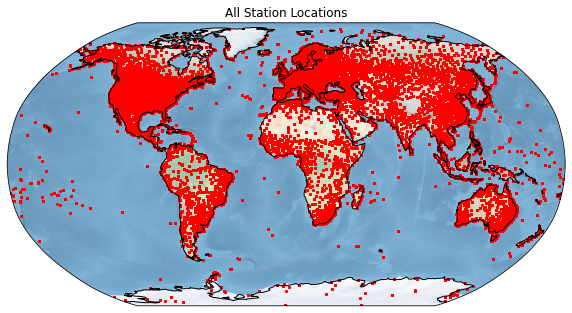

In [32]:

stations = get_operating_stations_by_year(gistemp_df)
lat, lon = get_station_locations(gistemp_inv_df, stations)

plot_gps_locations_world_cartopy(lat, lon, title='All Station Locations')



The following code block uses your implementation to identify a set of stations operating between `begin_year` and `end_year` and plots their locations.

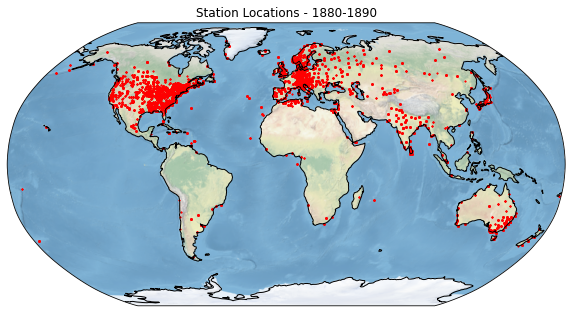

In [33]:

begin_year = 1880
end_year = 1890

stations = get_operating_stations_by_year(gistemp_df, begin_year, end_year)
lat, lon = get_station_locations(gistemp_inv_df, stations)

plot_gps_locations_world_cartopy(lat, lon, title=f'Station Locations - {begin_year}-{end_year}')



The following code block uses your implementations of `get_operating_stations_by_year`, `get_operating_stations_by_month` and `get_station_locations` to create an animation of the station locations through time.  You can modify the `month`, `begin_year` and `end_year` variables to modify which stations are displayed.  This code block may take several minutes - it is recommended that you reduce the number of years used in the animation when testing, and only return to the full range (1880 - 2020) once you are satisfied with your implementation.

In [34]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.animation
from IPython.display import HTML
import warnings
warnings.filterwarnings('ignore')

# Modify the following values to affect which stations are displayed
month = None
begin_year = 1880
end_year = 2020



fig = plt.figure(figsize=(10, 5))

#m = Basemap(projection='robin', llcrnrlat=-90, urcrnrlat=90,
#            llcrnrlon=0, urcrnrlon=360, resolution='c', lon_0=0)

#m.drawmapboundary()
#m.drawcoastlines(color='lightgray')
ax = fig.add_subplot(1, 1, 1, projection=ccrs.Robinson())
ax.set_global()
ax.stock_img()
ax.coastlines()


scat_obj = None

def animate_station_locations(frame_idx, ax, month, begin_year, end_year, df, inv_df):
    """
    Draws the locations of the station identified using `get_operating_stations_by_year`dd
    or `get_operating_stations_by_month`.  Any previous draw (as identified by scat_obj)
    is removed.
    """
    global scat_obj
    
    year = 1880+(frame_idx*4)
    if month is None:
        stations = get_operating_stations_by_year(df, year, year)
        plt.title(f'Station Locations ({year})')
    else:
        stations = get_operating_stations_by_month(df, month, year, year)
        plt.title(f'Station Locations ({month} {year})')

    lat, lon = get_station_locations(inv_df, stations)

    if scat_obj is not None:
        scat_obj.remove()
    x,y = lon.to_list(), lat.to_list()
    scat_obj = ax.scatter(x, y, marker='D',color='r', s=1, transform=ccrs.PlateCarree())
    if year >= end_year:
        plt.close() # prevents the additional plot display in notebook outside of the animation


def init():
    pass


# Create the animation
ani = matplotlib.animation.FuncAnimation(fig, 
                                         animate_station_locations,
                                         frames=int(np.ceil((end_year-begin_year+1)/4)), 
                                         fargs=(ax, 
                                                month,
                                                begin_year,
                                                end_year,
                                                gistemp_df,
                                                gistemp_inv_df),
                                         init_func=init)
# Generate HTML representation of the animation
HTML(ani.to_jshtml())



## Your Solution (6): Temperature Data Access

Complete the function `get_valid_station_temps_by_month` and `get_valid_station_temps_by_year`.  These functions will give access to the valid monthly and annual temperature data for all stations operating during the specified dates.

In [35]:

def get_valid_station_temps_by_month(df, month, year):
    """
    Creates and returns a np.array containing the valid temperatures from all
    stations operating during year, and have valid (non-NaN) data during the given
    month.  The order of the temperature values in the returned array matches the
    order of station ids given by get_operating_stations_by_month for the same month
    and year (single year, not range of years).
    df - A Pandas DataFrame with MultiIndex containing the station ID and years of
        operation, and columns containing the mean temperature recorded at each
        station during the month (column) and year (row).
    month - A string from the set of column names (months) in df.  Only stations
        with valid (non-NaN) data during this month will be included in the array 
        of temperatures returned.
    year - Numeric value representing a year from df.  Stations in service during 
        this year with valid data during month are inlcuded in the set of 
        temperatures returned.
    Returns - A np.array containing the ids of all operating stations in the
        given range of years with valid data in month.
    """
    df2 = gistemp_df.loc[(slice(None), range(year,year+1)), month]
    df3 = df2.dropna()
    
    station_temps = df3.to_numpy()
    
    return station_temps

    
def get_valid_station_temps_by_year(df, year):
    """
    Creates and returns a np.array containing the mean annual temperatures from all
    stations operating during year.  The order of the annual mean temperature in 
    the returned array matches the order of station ids given by 
    get_operating_stations_by_year for the same year (single year, not range of
    years).
    df - A Pandas DataFrame with MultiIndex containing the station ID and years of
        operation, and columns containing the mean temperature recorded at each
        station during the month (column) and year (row).
    year - Numeric value representing a year from df.  Stations in service during 
        this year with valid data are inlcuded in the set of annual means returned.
    Returns - A np.array containing the annual mean temperatures from all operating
        stations in the given year.
    """
    df2 = df.loc[(slice(None), range(year,year+1)), :]
    
    df3 = df2.dropna(thresh=1) #at least one month is not NaN
    
    
    df4 = df3.T
    df4.columns = df4.columns.droplevel(1)
    
    df5 = df4.mean(axis=0)
    station_temps = df5.to_numpy()
    return station_temps



## Test Code

The following code block uses your implementation to find stations operating during a given month and year and plot their locations colored by the mean temperature during that month.

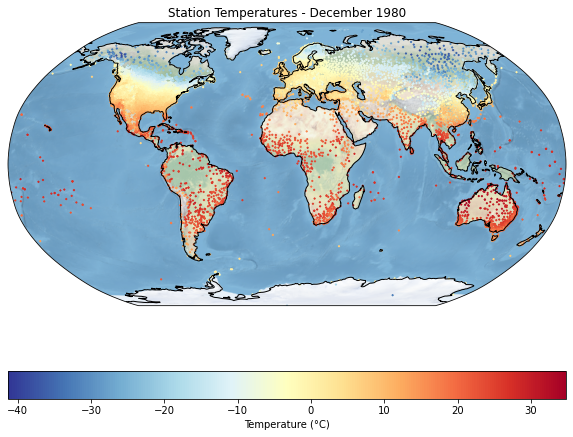

In [36]:

month = 'December'
year = 1980

station_temps = get_valid_station_temps_by_month(gistemp_df, month, year)

stations = get_operating_stations_by_month(gistemp_df, month, year, year)

lat, lon = get_station_locations(gistemp_inv_df, stations)

plot_gps_locations_world_cartopy(lat, lon, temp=station_temps, title=f'Station Temperatures - {month} {year}')


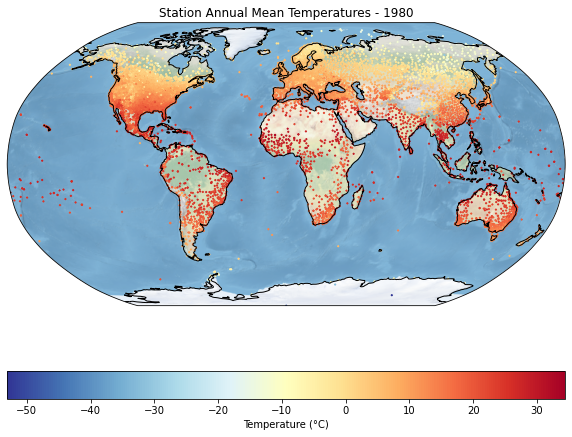

In [37]:
year = 1980

station_temps = get_valid_station_temps_by_year(gistemp_df, year)

stations = get_operating_stations_by_year(gistemp_df, year, year)

lat, lon = get_station_locations(gistemp_inv_df, stations)

plot_gps_locations_world_cartopy(lat, lon, temp=station_temps, title=f'Station Annual Mean Temperatures - {year}')


## Your Solution (7): Minimization Setup - Global Quantity of Interest

Complete the function `setup_system_global_mean_pwc` to create the system matrix and right hand side for the minimization.  The system matrix will have the number of rows equal to the number of basis functions, e.g. the number of cells (boxes) in our grid, and the number of columns equal to the number of measurements.  The values in this matrix will be either zero or one.  If an entry at (row, col) is one, then the measurement corresponding to col exists within the box corresponding to row.  The entries in the right hand side should be equal to the area of the grid cell (box) divided by the total surface area.  For the surface area of a grid cell (box) you can use the formula $\frac{\pi}{180} \cdot E^2 \cdot |sin(b_0) - sin(b_1)| \cdot |b_2 - b_3|$, where $E = 6375$km is an approximate radius of the Earth and $[b_0, b_1, b_2, b_3]$ are the north, south latitudes and west, east longitudes respectively.

The `box_contains` function will be helpful in your implementation of `setup_system_global_mean_pwc` and `setup_system_location_mean_pwc` later in the project.  The function simply returns True if the passed latitude and longitude are "within" the box and False otherwise.  A lat,lon pair is within a box if south < lat <= north and west < lon <= east.  Do note that with this test we exclude any station that is located at the south pole, which we will ignore for this project.

In [1]:

def box_contains(box, lat, lon):
    """
    Checks if the passed latitude and longitude are contained in box.
    box - A lists containing four values representing the north and south
        latitudes and west and east longitudes, in that order, of the box
        boundary.
    lat - The latitude (in degrees) that is to be tested against box.  This
        value is expected to be in the range [-90, 90], where 90 degrees is 
        the north pole and -90 degrees is the south pole.
    lon - The longitude (in degrees) that is to be tested against box.  This
        value is expected to be in the range [-180, 180], where 0 degrees is
        the Prime Meridian with west negative and east positive from 0.
    Returns - True if (lat, lon) exists within (including all boundaries) the 
        specified box.
    Note that a lat,lon pair is within box if south < lat <= north and 
        west < lon <= east.  Also, with this test we exclude any station that
        is located at the south pole, which we will ignore for this project.
    """
    return lat[1]<=box[0] and box[1]<=lat[0] and lon[0]<=box[2] and box[3]<=lon[1]


def setup_system_global_mean_pwc(station_lats, station_lons, boxes=None):
    """
    Given a set of latitudes and longitudes this function creates a matrix whose 
    rows represent a piecewise constant basis, and columns represent the set of
    (lat, lon) pairs given by zip(station_lats, station_lons).  The function also
    creates the correponding righthand side for the global mean.
    station_lats - The latitudes (in degrees) of each station to be considered in
        the optimization.  Each value is expected to be in the range [-90, 90], 
        where 90 degrees is the north pole and -90 degrees is the south pole.
    station_lons - The longitudes (in degrees) of each station to be considered in
        the optimization.  Each value is expected to be in the range [-180, 180],
        where 0 degrees is the Prime Meridian with west negative and east positive
        from 0.
    boxes - If boxes is None then the `create_hansen_grid_80()` will be used to 
        create the world grid from which the piecewise constant basis will be 
        generated.  If boxes is not None then it is expected to be an iterable
        whose elements are lists containing four values representing the north and
        south latitudes and west and east longitudes, in that order.
    Returns - A tuple (B,c) containing the system matrix, B, and the right hand 
        side, c.  B will have shape (len(boxes), len(station_lats)), and c will
        have shape (len(boxes), 1).
    """
    pass



## Your Solution (8): Minimzation

Complete the function `optimize_weights_pwc` using cvxpy to perform the optimization from Algorithm 1 in the notes with piece-wise constant basis.

In [ ]:

def optimize_weights_pwc(B, c, verbose=False):
    """
    This function implements the minimization from Algorithm 1 from the notes.  
    Given a set of latitudes and longitudes (x_1,...,x_m in the notes) this 
    function computes the weights, a_i, to be applied to the measurements, y_i, 
    when computing the weighted mean.  
    B - An np.arrray with dimension (num_bases, num_observations) representing the 
        system matrix for the optimization.
    c - An np.array with dimension (num_bases, 1) representing the right-hand side.
    verbose - If True the function will output text giving information regarding 
        the progress of the optimization and results.
    Returns - A tuple containing the cp.Problem object used in the minimization,
        an np.array containing the weights a_i, and the value of the compatibility
        indicator mu.
    """
    pass



## Your Solution (9): Driver - Global Quantity of Interest

Complete the function `optimize_global_mean_pwc`.  This function will compute either the global mean temperature for a given month in a given year, or if month is None then it will compute the global annual mean temperature for the given year.  This function should leverage the functions you have already implemented and should return the global temperature, $\sum_{i=1}^m a_i \cdot y_i$.

In [ ]:

def optimize_global_mean_pwc(df, inv_df, year, month=None, boxes=None, verbose=False):
    """
    Computes the global mean temperature from either the annual mean temperatures,
    or the monthly temperatures using the given station data and inventory.
    df - A Pandas DataFrame with MultiIndex containing the station ID and years of
        operation, and columns containing the mean temperature recorded at each
        station during the month (column) and year (row).
    inv_df - A Pandas DataFrame containing the latitude, longitude and station name.
    year - Numeric value representing a year from df.  Stations in service during 
        this year with valid data inlcuded in the optimization.
    month - A string from the set of column names (months) in df.  Only stations
        with valid (non-NaN) data during this month will be included in the returned
        Pandas Index.  If month is None then the annual mean for all stations will
        be computed first, and the optimzation run using annual means in place of
        monthly values.
    boxes - If boxes is None then the `create_hansen_grid_80()` will be used to 
        create the world grid from which the piecewise constant basis will be 
        generated.  If boxes is not None then it is expected to be an iterable
        whose elements are lists containing four values representing the north and
        south latitudes and west and east longitudes, in that order.
    verbose - If True the function will output text giving information regarding 
        the progress of the optimization and results.
    Returns - The global mean temperature for a given month,year or annually.
    """
    pass



## Test Code

The following code block runs your optimization for a given month and year.

In [ ]:
month = 'May'
year = 1961

global_mean = optimize_global_mean_pwc(gistemp_df, gistemp_inv_df, year, month, verbose=True)
print(f'Global Mean Temperature during {month} {year}: {global_mean}')

## Comparison: Naive Mean vs Recovery

The following code blocks will use your implementations above to plot various values to compare the results of the naive mean and recovery using piecewise constants.  Note that the recovery optimization can take some time to complete for all years in the data set.

In [ ]:

naive_means = compute_annual_temperature_means(gistemp_df).to_list()



In [ ]:
begin_year = 1880
end_year = 2020
step = 10  # in your testing you may wish to increase the step size to save time

recovery_means = []
for year in range(begin_year, end_year+1, step):
    if year % 10 == 0:
        print(year)  # simple progress indicator
    try:
        annual_mean = optimize_global_mean_pwc(gistemp_df, gistemp_inv_df, year)
    except:
        annual_mean = np.NaN
        print(f'Optimization Failed - {year}')
    recovery_means.append(annual_mean)
    
    

In [ ]:

fig = plt.figure(figsize=(12, 6))
    
plt.plot(np.arange(begin_year, end_year+1, step), naive_means[::step], 'r', linewidth=2)
plt.plot(np.arange(begin_year, end_year+1, step), recovery_means, 'g', linewidth=2)

plt.legend(['Naive Mean', 'Recovery Mean'])

plt.xlabel('Year')
plt.ylabel('Temperature (°C)')
plt.title('Global Annual Mean Comparison')
plt.show()



## Your Solution (10): Minimization Setup - Local Quantity of Interest

For this function you may copy your implementation from `setup_system_global_mean_pwc` and modify it slightly to implement `setup_system_location_mean_pwc`.  Instead of the global mean temperature, our quantity of interest will be a location (or grid cell in this instance).  The matrix $B$ should be the same, but the entries in the righthand side $c$ should only be set if the corresponding basis function is non-zero at `eval_location`.

In [ ]:

def setup_system_location_mean_pwc(station_lats, station_lons, eval_location, boxes=None):
    """
    Given a set of latitudes and longitudes this function creates a matrix whose 
    rows represent a piecewise constant basis, and columns represent the set of
    (lat, lon) pairs given by zip(station_lats, station_lons).  The function also
    creates a right hand side for computing the mean temperature at the 
    eval_location.
    station_lats - The latitudes (in degrees) of each station to be considered in
        the optimization.  Each value is expected to be in the range [-90, 90], 
        where 90 degrees is the north pole and -90 degrees is the south pole.
    station_lons - The longitudes (in degrees) of each station to be considered in
        the optimization.  Each value is expected to be in the range [-180, 180],
        where 0 degrees is the Prime Meridian with west negative and east positive
        from 0.
    eval_location - A tuple or list containing the latitude and longitude of the
        location where the temperature should be evaluated.
    boxes - If boxes is None then the `create_hansen_grid_80()` will be used to 
        create the world grid from which the piecewise constant basis will be 
        generated.  If boxes is not None then it is expected to be an iterable
        whose elements are lists containing four values representing the north and
        south latitudes and west and east longitudes, in that order.
    Returns - A tuple (B,c) containing the system matrix, B, and the right hand 
        side, c.  B will have shape (len(boxes), len(station_lats)), and c will
        have shape (len(boxes), 1).
    """
    pass



## Your Solution (11): Driver - Local Quantity of Interest

For this function you may copy your implementation from `optimize_global_mean_pwc` and modify it slightly to implement `optimize_location_mean_pwc` as it should only differ by the use of `setup_system_location_mean_pwc`.

In [ ]:

def optimize_location_mean_pwc(df, inv_df, eval_location, year, month=None, boxes=None, verbose=False):
    """
    Computes the mean temperature evaluated at eval_location from either the annual
    mean temperatures, or the monthly temperatures using the given station data and 
    inventory.
    df - A Pandas DataFrame with MultiIndex containing the station ID and years of
        operation, and columns containing the mean temperature recorded at each
        station during the month (column) and year (row).
    inv_df - A Pandas DataFrame containing the latitude, longitude and station name.
    eval_location - A tuple containing the latitude and longitude where the mean
        temperature should be evaluated.
    year - Numeric value representing a year from df.  Stations in service during 
        this year with valid data inlcuded in the optimization.
    month - A string from the set of column names (months) in df.  Only stations
        with valid (non-NaN) data during this month will be included in the returned
        Pandas Index.  If month is None then the annual mean for all stations will
        be computed first, and the optimzation run using annual means in place of
        monthly values.
    boxes - If boxes is None then the `create_hansen_grid_80()` will be used to 
        create the world grid from which the piecewise constant basis will be 
        generated.  If boxes is not None then it is expected to be an iterable
        whose elements are lists containing four values representing the north and
        south latitudes and west and east longitudes, in that order.
    verbose - If True the function will output text giving information regarding 
        the progress of the optimization and results.
    Returns - The mean temperature evaluated at eval_location.
    """
    pass



## Your Solution (12): Identify Texas Stations

Complete the function `get_station_data_by_state` to identify all stations in a given state and return new DataFrame's containing only those stations and their data.  Be aware that the inventory may contain stations that do not appear in the data, and the returned DataFrames should not contain station data for stations that do not appear in both returned DataFrames.

**Hint:** The station names in the inventory include the US state name in which they exist at the very end of their name.  When identifying stations in the state of Texas, you should find all rows whose value in the name column ends with `TEXAS`.  For those using regular expressions, the end of the line is represented by `$`.  Be aware that some station names may include `TEXAS` elsewhere in their name, but are not in Texas.

In [ ]:

def get_station_data_by_state(df, inv_df, state):
    """
    Returns a pair of Pandas DataFrames containing the data from df and inv_df 
    corresponding to the stations operating in state.
    df - A Pandas DataFrame with MultiIndex containing the station ID and years of
        operation, and columns containing the mean temperature recorded at each
        station during the month (column) and year (row).
    inv_df - A Pandas DataFrame containing the latitude, longitude and station name.
    state - A string containing the name of the state whose data will be returned.
    Returns - A tuple containing the state data from df and inv_df.  Both 
        returned DataFrames will contain the exact same set of stations.
    """
    pass



## Test Code

This block uses plots the stations operating in Texas from any time.

In [ ]:

texas_df, texas_inv_df = get_station_data_by_state(gistemp_df, gistemp_inv_df, 'texas')

texas_lat, texas_lon = get_station_locations(texas_inv_df)

plot_gps_locations_texas_cartopy(texas_lat, texas_lon)



The following block creates a grid for our piecewise constant basis over the state of texas and plots this grid along with the Texas stations and the location of College Station.

In [ ]:

college_station_texas = (30.601389, -96.314445) # (lat, lon)

texas_boxes = create_texas_grid()

plot_gps_locations_texas_cartopy(texas_lat, texas_lon, boxes=texas_boxes, marker_location=college_station_texas)



We will now use your optimization functions to evaluate the temperature in College Station using only those stations found in Texas during `month` and `year` below.  According to Wunderground the temperature in College Staion for August 2010 is approximately 87°F (30.55°C).

In [ ]:

month = 'August'
year = 2010

try:
    local_mean_temp = optimize_location_mean_pwc(texas_df, 
                                                 texas_inv_df, 
                                                 eval_location=college_station_texas, 
                                                 year=year, 
                                                 month=month, 
                                                 boxes=texas_boxes, 
                                                 verbose=True)
except:
    print('Optimization Failed')
else:    
    if month is None:
        print(f'College Station Temperature in {year} : {local_mean_temp} °C')
    else:
        print(f'College Station Temperature in {month} {year} : {local_mean_temp} °C')



I am sorry but I could not quite finish this project. But I am turning in what I have so far as I cannot take any more time.